### run to get average results and standard deviation

In [ ]:
import os
import pandas as pd


root_dir = "F:/Github Repos/Restrictive-Hierarchical-Code/Predictions/unet_orig_extended_test"

# Initialize lists to store metrics from all folds
accuracy_list, iou_list, dice_list, precision_list, recall_list, class_list = [], [], [], [], [], []
first = True

for folder in os.listdir(root_dir):
    folder_path = os.path.join(root_dir, folder)
    if os.path.isdir(folder_path) and folder.startswith("fold_"):
        metrics_file = os.path.join(folder_path, "metrics.csv")
        if os.path.exists(metrics_file):
            # Read the metrics.csv file
            df = pd.read_csv(metrics_file)
            # traverses rows
            for clss in range(len(df['Class'])):
                cur_row = df[df['Class'] == df['Class'][clss]]
                # Extract rows with average results and independent class results
                # avg_row = df[df['Type'] == 'Average']
                if first:
                    class_list.append(df['Class'][clss])
                    # Append metrics to the respective lists
                    accuracy_list.append([cur_row['Accuracy'].values[0]])
                    iou_list.append([cur_row['IoU'].values[0]])
                    dice_list.append([cur_row['Dice'].values[0]])
                    precision_list.append([cur_row['Precision'].values[0]])
                    recall_list.append([cur_row['Recall'].values[0]])
                else:
                    # cur_posit = class_list.index(clss)
                    # apends to the matching sublist
                    accuracy_list[clss].append(cur_row['Accuracy'].values[0])
                    iou_list[clss].append(cur_row['IoU'].values[0])
                    dice_list[clss].append(cur_row['Dice'].values[0])
                    precision_list[clss].append(cur_row['Precision'].values[0])
                    recall_list[clss].append(cur_row['Recall'].values[0])
            first=False


# Calculate mean and standard deviation for each metric
results = []

# Loop through the results lists and calculate mean and standard deviation for each class
for idx, clss in enumerate(class_list):
    results.append({
        "Class": clss,
        "Accuracy Mean": pd.Series(accuracy_list[idx]).mean(),
        "Accuracy Std": pd.Series(accuracy_list[idx]).std(),
        "IoU Mean": pd.Series(iou_list[idx]).mean(),
        "IoU Std": pd.Series(iou_list[idx]).std(),
        "Dice Mean": pd.Series(dice_list[idx]).mean(),
        "Dice Std": pd.Series(dice_list[idx]).std(),
        "Precision Mean": pd.Series(precision_list[idx]).mean(),
        "Precision Std": pd.Series(precision_list[idx]).std(),
        "Recall Mean": pd.Series(recall_list[idx]).mean(),
        "Recall Std": pd.Series(recall_list[idx]).std(),
    })

# Save the results as metrics.csv in the original file location
output_df = pd.DataFrame(results)
output_file = os.path.join(root_dir, "metrics.csv")
output_df.to_csv(output_file, index=False)

print(f"Metrics saved to {output_file}")

Metrics saved to F:/Github Repos/Restrictive-Hierarchical-Code/Predictions/unet_orig_extended_test\metrics.csv


### view qualitative results

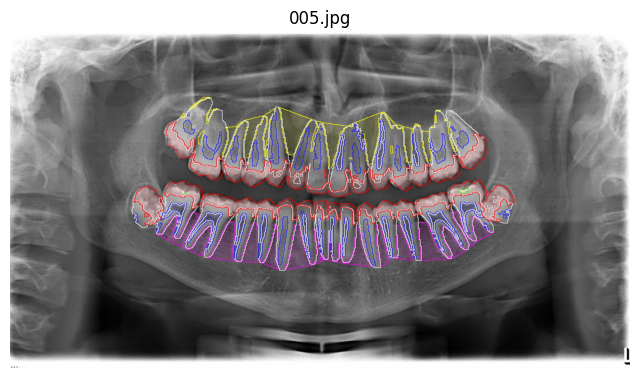

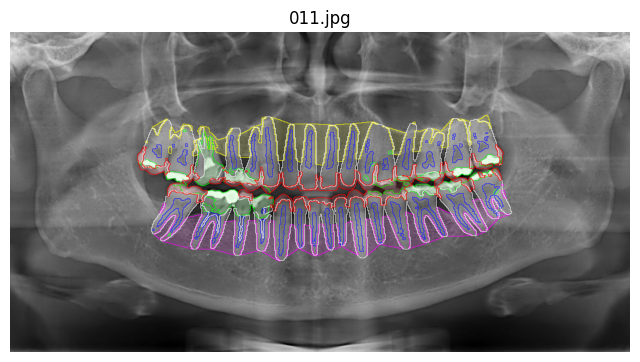

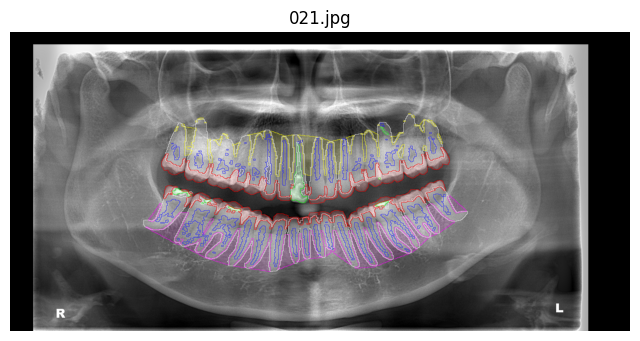

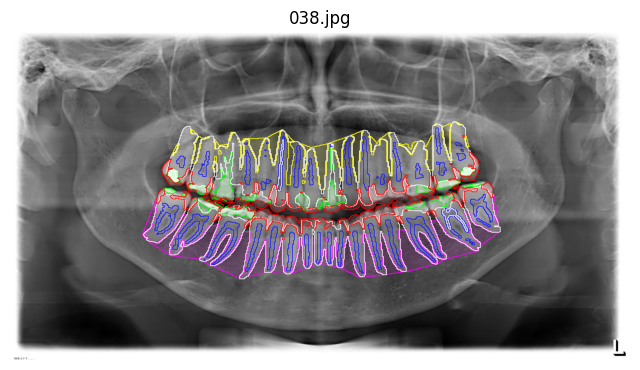

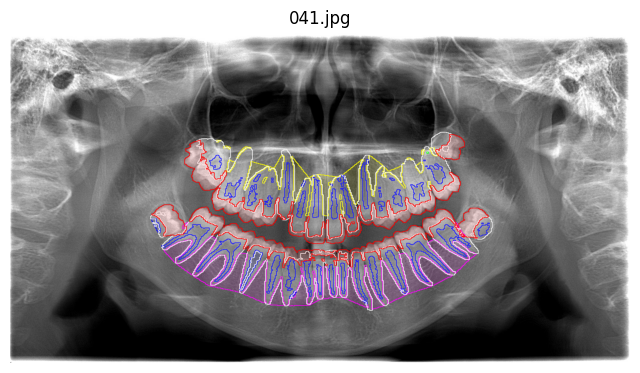

...

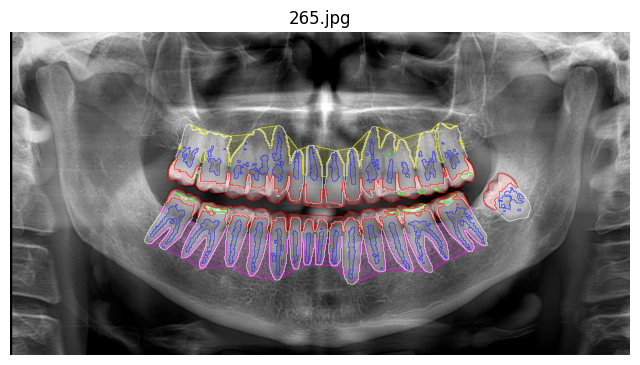

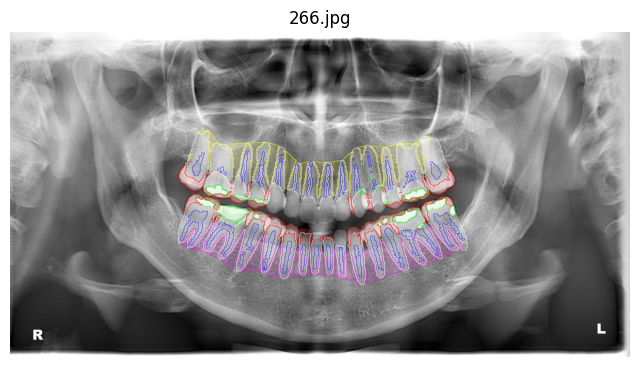

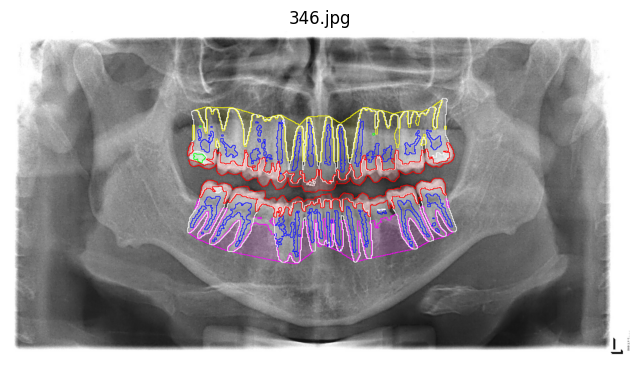

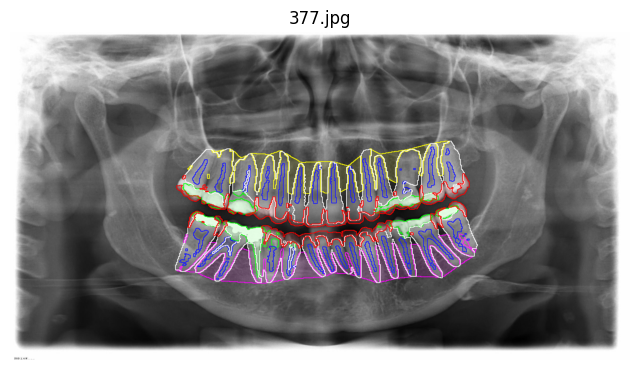

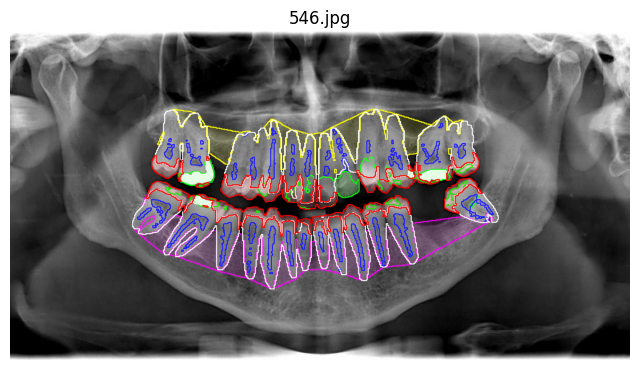

In [ ]:
import cv2
import numpy as np
import os
import pandas as pd

import matplotlib.pyplot as plt

# Specify the directories
# I:/Datasets/Hierarchical Datasets/TL_pano/processed/cross_val/fold_1/val/labels
image_dir = r"D:/Datasets Main/5. tooth layer segmentation/TL_pano/semantic/5_fold/fold_1/val/images"  # Update this to your images folder F:/Github Repos/Restrictive-Hierarchical-Code/Predictions/exp2_2
mask_root_dir = r"F:/Github Repos/Restrictive-Hierarchical-Code/Predictions/images_extended_unet_hier/fold_1"  # Update this to your masks root folder
target_mask_root_dir = r"D:/Datasets Main/5. tooth layer segmentation/TL_pano/semantic/5_fold/fold_1/val/labels"
class_map = r"F:/Github Repos/Restrictive-Hierarchical-Code/class_map.csv"

# Specify the class list and colors for polygons
# class_colors = {
#     '0': (0, 0, 0), # background
#     '1': (0, 255, 255), # upper
#     '2': (255, 0, 255), # lower
#     '3': (255, 255, 0), # tooth
#     '4': (255, 0, 0), # pulp
#     '5': (255, 255, 255), # dentin
#     '6': (0, 0, 255), # enamel
#     '7': (0, 255, 0), # composite
# }

# for extended classes
class_colors = {
    '0': (0, 0, 0), # background
    '1': (0, 0, 0), # T+A
    '2': (0, 0, 0), # Alveolar
    '3': (0, 0, 0), # Tooth
    '4': (0, 255, 255), # upper
    '5': (255, 0, 255), # lower
    '6': (0, 255, 0), # composite
    '7': (0, 0, 0), # Healthy
    '8': (255, 0, 0), # pulp
    '9': (255, 255, 255), # dentin
    '10': (0, 0, 255), # enamel
}


# ignore_class = ['0', '3']

# for extended classes
ignore_class = ['0', '1', '2', '3', '7']

target_masks_only = False  # Set to True if you want to only display target masks

# resize_val = 620

# Traverse images in the image_dir
for img_name in os.listdir(image_dir):
    # img_path = os.path.join(image_dir, img_name)
    # if not img_name.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tif')):
    #     continue
    # img = cv2.imread(img_path)
    # img_disp = img.copy()

    # # resizes to 620x620
    # # img_disp = cv2.resize(img_disp, (resize_val, resize_val), interpolation=cv2.INTER_LINEAR)
    # img_width, img_height = img_disp.shape[1], img_disp.shape[0]

    # # For each class, overlay the polygon from the binary mask
    # for clss in class_colors:
    #     # mask_dir = os.path.join(mask_root_dir, clss)
    #     mask_path = os.path.join(mask_root_dir, clss, img_name.split('.')[0]+".png")
    #     if os.path.exists(mask_path):
    #         mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    #         # resizes the mask to match the image size
    #         mask = cv2.resize(mask, (img_width, img_height), interpolation=cv2.INTER_LINEAR)
    #         if mask is not None and np.any(mask):
    #             # Find contours (polygons) in the binary mask
    #             contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    #             cv2.drawContours(img_disp, contours, -1, class_colors.get(clss), 2)

    # # Convert BGR to RGB for matplotlib
    # img_disp = cv2.cvtColor(img_disp, cv2.COLOR_BGR2RGB)
    # plt.figure(figsize=(8, 8))
    # plt.imshow(img_disp)
    # plt.title(img_name)
    # plt.axis('off')
    # plt.show()




    img_path = os.path.join(image_dir, img_name)
    if not img_name.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tif')):
        continue
    img = cv2.imread(img_path)
    img_disp = img.copy()
    img_width, img_height = img_disp.shape[1], img_disp.shape[0]

    # reads class_map 
    class_map_df = pd.read_csv(class_map)

    overlay = img_disp.copy()
    if target_masks_only:
        mask_path = os.path.join(target_mask_root_dir, img_name.split('.')[0]+".png")
        # traversess the class map
        if os.path.exists(mask_path):
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
            mask = cv2.resize(mask, (img_width, img_height), interpolation=cv2.INTER_LINEAR)
            if mask is not None and np.any(mask):
                # traverses the class_map_df
                for idx, row in class_map_df.iterrows():
                    clss = str(row['class_id'])
                    if clss in ignore_class:
                        continue
                    # Get the color for the class
                    # color = class_colors.get(clss, (255, 255, 255))
                    # creates a binary masks for the current class using row['pixel_val']
                    binary_mask = np.where(mask == row['pixel_val'], 255, 0).astype(np.uint8)


                    contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
                    cv2.drawContours(overlay, contours, -1, class_colors.get(clss), thickness=cv2.FILLED)
                    # Draw the outline
                    cv2.drawContours(img_disp, contours, -1, class_colors.get(clss), 2)
    else:
        for clss in class_colors:
            if clss in ignore_class:
                continue
            mask_path = os.path.join(mask_root_dir, clss, img_name.split('.')[0]+".png")
            if os.path.exists(mask_path):
                mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
                mask = cv2.resize(mask, (img_width, img_height), interpolation=cv2.INTER_LINEAR)
                if mask is not None and np.any(mask):
                    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
                    # Fill the contour with color (low opacity)
                    cv2.drawContours(overlay, contours, -1, class_colors.get(clss), thickness=cv2.FILLED)
                    # Draw the outline
                    cv2.drawContours(img_disp, contours, -1, class_colors.get(clss), 2)

    # Blend the overlay with the original image
    alpha = 0.1  # Opacity for the fill
    img_disp = cv2.addWeighted(overlay, alpha, img_disp, 1 - alpha, 0)

    img_disp = cv2.cvtColor(img_disp, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(8, 8))
    plt.imshow(img_disp)
    plt.title(img_name)
    plt.axis('off')
    plt.show()